# Import libraries, define paths and parameters

In [2]:
import tensorflow as tf

import os
import time
import cv2
import random
import numpy as np
import shutil

from matplotlib import pyplot as plt
from IPython import display
%matplotlib inline

from keras.models import model_from_json
from keras.applications import MobileNet
from keras.models import Model
from keras.models import model_from_json
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# DIRECTORIES
PATH = "/content/drive/MyDrive/GAN_flaws_detection/"
path_data = PATH + "data/"
path_chess_data = path_data + "chess/"
path_real_pictures = path_data + "real_pictures/"
path_good = path_data + "real_pictures/" + "Good/"
path_train = path_chess_data + "train/"
path_val = path_chess_data + "val/"
path_models = PATH + 'models/'
path_cad_generated = PATH + "data/cad_generated/"
path_cad_pics = PATH + "data/cad_pictures/"
path_real_pics = PATH + "data/real_pictures/All/"
path_features = PATH + "data/features/"

In [6]:
# PARAMETERS
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3
LAMBDA = 100
EPOCHS = 100

# Create Chess Dataset From raw images

In [7]:
# Align images
MAX_FEATURES = 500
GOOD_MATCH_PERCENT = 0.15

def alignImages(im1, im2):
    # Convert images to grayscale
    im1Gray = cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)
    im2Gray = cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)
  
    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1Gray,None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2Gray,None)

    # Match features.
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1,descriptors2,None)

    # Sort matches by score
    matches.sort(key=lambda x: x.distance,reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Draw top matches
    imMatches = cv2.drawMatches(im1,keypoints1,im2,keypoints2,matches,None)
    # cv2.imwrite("matches.jpg", imMatches)

    # Extract location of good matches
    points1 = np.zeros((len(matches),2),dtype=np.float32)
    points2 = np.zeros((len(matches),2),dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    # Find homography
    h, mask = cv2.findHomography(points1,points2,cv2.RANSAC)

    # Use homography
    height, width, channels = im2.shape
    im1Reg = cv2.warpPerspective(im1,h,(width,height),borderMode=cv2.BORDER_REPLICATE)
    
    return im1Reg, h

In [ ]:
for filename in os.listdir(path_cad_pics):
    if filename.endswith('.png'):
        name = filename.replace('.png', '')
        # load cad picture and resize it to square
        cad_img = cv2.resize(cv2.imread(path_cad_pics + filename, cv2.IMREAD_COLOR), (IMG_WIDTH , IMG_HEIGHT))
        for img_name in os.listdir(path_good): 
            if name == img_name[:-7]:
                # load and resize real image
                real_img = cv2.resize(cv2.imread(path_good + img_name, cv2.IMREAD_COLOR), (IMG_WIDTH , IMG_HEIGHT))
                # align real image with cad image
                real_img_aligned, h = alignImages(real_img, cad_img)
                # concatenate real and cad images in the same picture
                final_img = cv2.hconcat([real_img_aligned, cad_img])
                # save the result to file with the right name and folder structure
                if int(img_name[-6:-4]) == 1:
                    path = path_val + name + img_name[-7:-4] + '.jpg'
                else: 
                    path = path_train + name + img_name[-7:-4] + '.jpg'
                
                cv2.imwrite(path, final_img)
                print(name + img_name[-7:-4] + '.jpg')

# Train Generator

## Load the dataset

You can download this dataset and similar datasets from [here](https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets). As mentioned in the [paper](https://arxiv.org/abs/1611.07004) we apply random jittering and mirroring to the training dataset.

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`
* In random mirroring, the image is randomly flipped horizontally i.e left to right.

In [ ]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

(256, 256, 3)


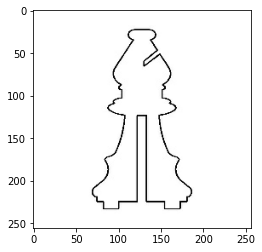

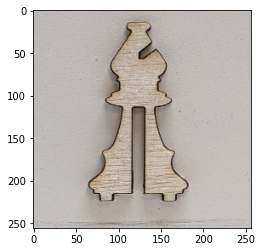

In [ ]:
inp, re = load(path_data + 'chess/train/bishop_up_02.jpg')
inp, re = resize(inp, re, IMG_HEIGHT, IMG_WIDTH)
print(inp.shape)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)
plt.show()

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

As you can see in the images below
that they are going through random jittering
Random jittering as described in the paper is to

1. Resize an image to bigger height and width
2. Randomly crop to the target size
3. Randomly flip the image horizontally

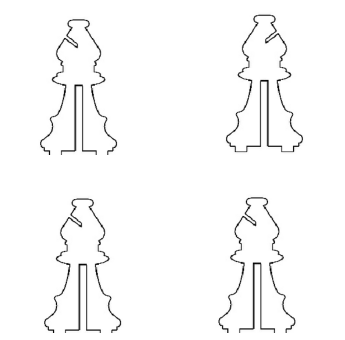

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Input Pipeline

In [ ]:
train_dataset = tf.data.Dataset.list_files(path_chess_data + 'train/*.jpg')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
test_dataset = tf.data.Dataset.list_files(path_chess_data + 'val/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Build the Generator
  * The architecture of generator is a modified U-Net.
  * Each block in the encoder is (Conv -> Batchnorm -> Leaky ReLU)
  * Each block in the decoder is (Transposed Conv -> Batchnorm -> Dropout(applied to the first 3 blocks) -> ReLU)
  * There are skip connections between the encoder and decoder (as in U-Net).


In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

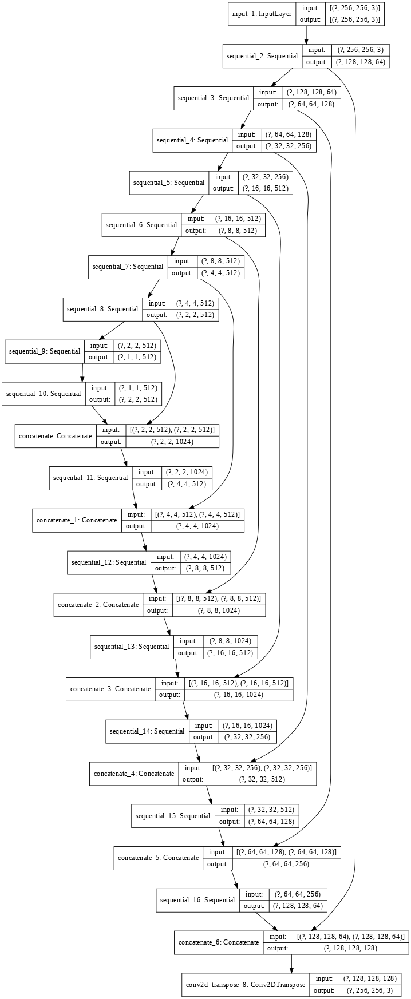

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


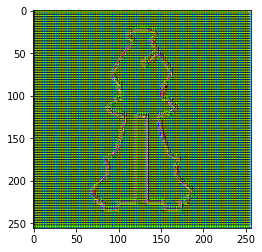

In [ ]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

* **Generator loss**
  * It is a sigmoid cross entropy loss of the generated images and an **array of ones**.
  * The [paper](https://arxiv.org/abs/1611.07004) also includes L1 loss which is MAE (mean absolute error) between the generated image and the target image.
  * This allows the generated image to become structurally similar to the target image.
  * The formula to calculate the total generator loss = gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. This value was decided by the authors of the [paper](https://arxiv.org/abs/1611.07004).

The training procedure for the generator is shown below:

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Build the Discriminator
  * The Discriminator is a PatchGAN.
  * Each block in the discriminator is (Conv -> BatchNorm -> Leaky ReLU)
  * The shape of the output after the last layer is (batch_size, 30, 30, 1)
  * Each 30x30 patch of the output classifies a 70x70 portion of the input image (such an architecture is called a PatchGAN).
  * Discriminator receives 2 inputs.
    * Input image and the target image, which it should classify as real.
    * Input image and the generated image (output of generator), which it should classify as fake.
    * We concatenate these 2 inputs together in the code (`tf.concat([inp, tar], axis=-1)`)

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

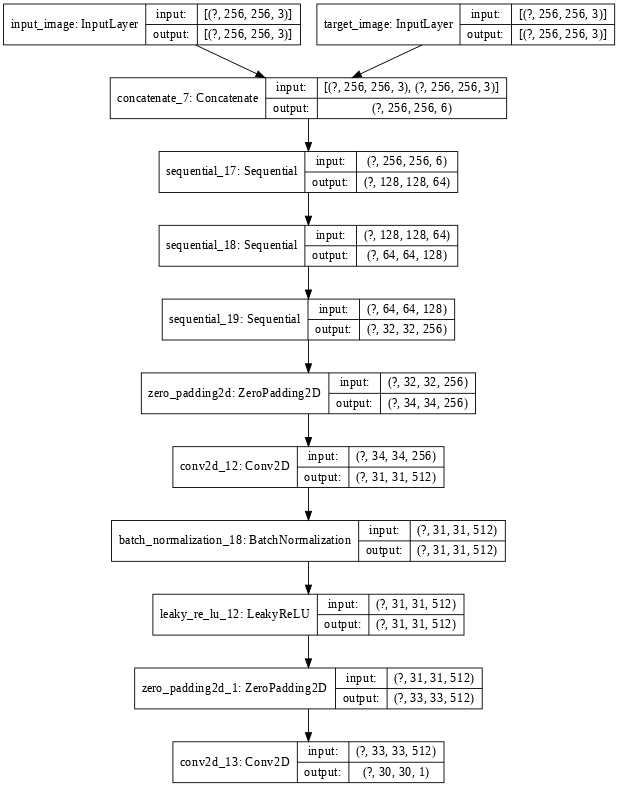

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

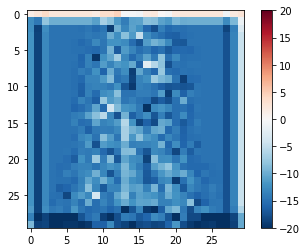

In [ ]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

**Discriminator loss**
  * The discriminator loss function takes 2 inputs; **real images, generated images**
  * real_loss is a sigmoid cross entropy loss of the **real images** and an **array of ones(since these are the real images)**
  * generated_loss is a sigmoid cross entropy loss of the **generated images** and an **array of zeros(since these are the fake images)**
  * Then the total_loss is the sum of real_loss and the generated_loss


In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

To learn more about the architecture and the hyperparameters you can refer the [paper](https://arxiv.org/abs/1611.07004).

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Define the Optimizers and Checkpoint-saver


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate Images

Write a function to plot some images during training.

* We pass images from the test dataset to the generator.
* The generator will then translate the input image into the output.
* Last step is to plot the predictions and **voila!**

Note: The `training=True` is intentional here since
we want the batch statistics while running the model
on the test dataset. If we use training=False, we will get
the accumulated statistics learned from the training dataset
(which we don't want)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

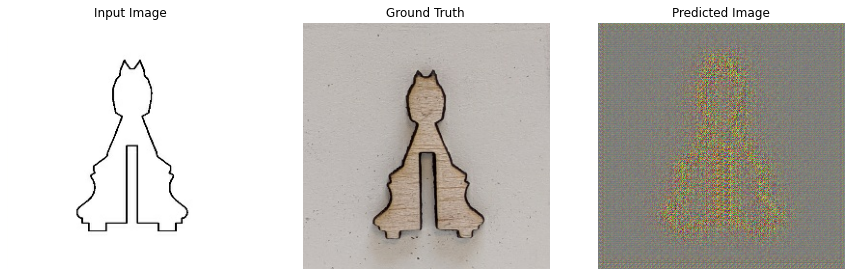

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## Training

* For each example input generate an output.
* The discriminator receives the input_image and the generated image as the first input. The second input is the input_image and the target_image.
* Next, we calculate the generator and the discriminator loss.
* Then, we calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
* Then log the losses to TensorBoard.

In [ ]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

The actual training loop:

* Iterates over the number of epochs.
* On each epoch it clears the display, and runs `generate_images` to show it's progress.
* On each epoch it iterates over the training dataset, printing a '.' for each example.
* It saves a checkpoint every 20 epochs.

In [ ]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix = checkpoint_prefix)

This training loop saves logs you can easily view in TensorBoard to monitor the training progress. Working locally you would launch a separate tensorboard process. In a notebook, if you want to monitor with TensorBoard it's easiest to launch the viewer before starting the training.

To launch the viewer paste the following into a code-cell:

In [ ]:
#docs_infra: no_execute
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
%reload_ext tensorboard

Now run the training loop:

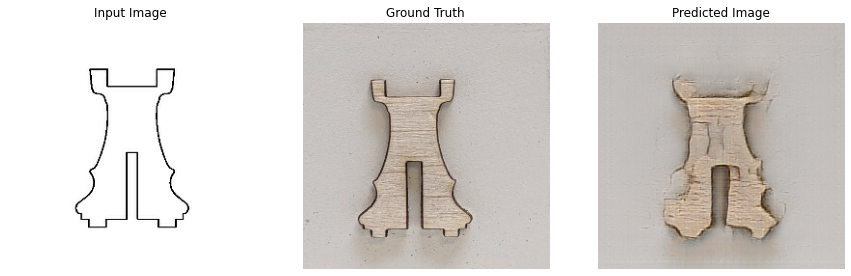

Epoch:  99
................................................................
Time taken for epoch 100 is 10.408643007278442 sec



In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

If you want to share the TensorBoard results _publicly_ you can upload the logs to [TensorBoard.dev](https://tensorboard.dev/) by copying the following into a code-cell.

Note: This requires a Google account.

```
!tensorboard dev upload --logdir  {log_dir}
```

Caution: This command does not terminate. It's designed to continuously upload the results of long-running experiments. Once your data is uploaded you need to stop it using the "interrupt execution" option in your notebook tool.

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

TensorBoard.dev is a managed experience for hosting, tracking, and sharing ML experiments with everyone.

It can also included inline using an `<iframe>`:

In [ ]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")

Interpreting the logs from a GAN is more subtle than a simple classification or regression model. Things to look for::

* Check that neither model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
* The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2: That the discriminator is on average equally uncertain about the two options.
* For the `disc_loss` a value below `0.69` means the discriminator is doing better than random, on the combined set of real+generated images.
* For the `gen_gan_loss` a value below `0.69` means the generator i doing better than random at foolding the descriminator.
* As training progresses the `gen_l1_loss` should go down.

## Restore the latest checkpoint and test

In [ ]:
!ls {checkpoint_dir}

checkpoint		    ckpt-4.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-4.index
ckpt-1.index		    ckpt-5.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-5.index
ckpt-2.index		    ckpt-6.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-6.index
ckpt-3.index


In [ ]:
# restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Generate using test dataset

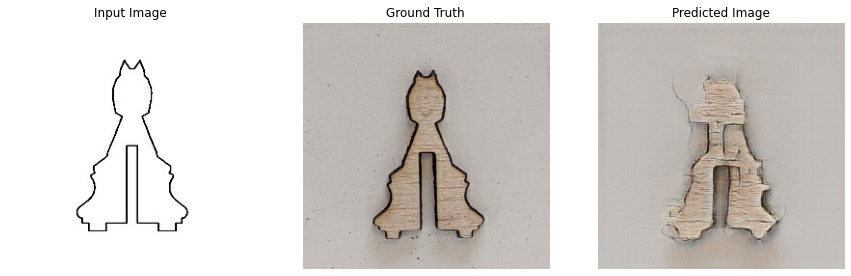

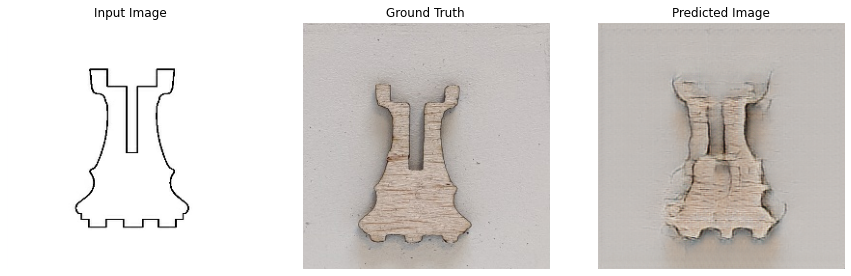

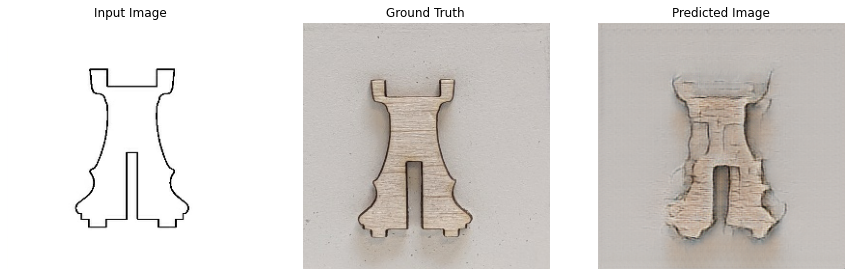

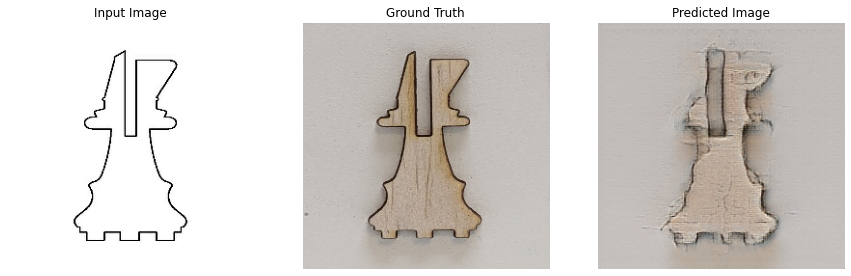

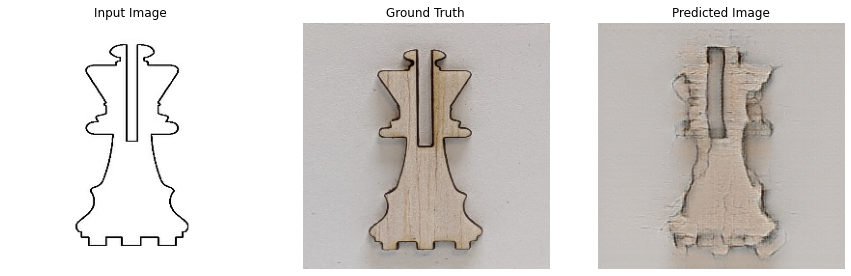

In [ ]:
# Run the trained model on a few examples from the test dataset
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

## Save Generator Model to file

In [ ]:
# Save the generator model to JSON format
# serialize model to JSON
model_json = generator.to_json()
with open(path_models + 'generator.json', "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
generator.save_weights(path_models + "generator_weights.h5")
print("Saved Generator model to disk")

# Save the discriminator model to JSON format
# serialize model to JSON
model_json = discriminator.to_json()
with open(path_models + 'discriminator.json', "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
discriminator.save_weights(path_models + "discriminator_weights.h5")
print("Saved Discriminator model to disk")

Saved Generator model to disk
Saved Discriminator model to disk


# Generate and Save Artificial Images

In [ ]:
# Load Generator model
# load json and create model
json_file = open(path_models + 'generator.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
generator = model_from_json(loaded_model_json)
# load weights into new model
generator.load_weights(path_models + "generator_weights.h5")
print("Loaded Generator model from disk")

Loaded Generator model from disk


In [ ]:
for filename in os.listdir(path_cad_pics):
  if ".png" in filename:
    cad_img = cv2.imread(path_cad_pics + filename, cv2.IMREAD_COLOR)
    cad_img = (cv2.resize(cad_img, (256, 256))/ 127.5) - 1
    gen_img = generator(cad_img[np.newaxis, ...])
    plt.figure(figsize=(5,5))
    plt.imshow(gen_img[0] * 0.5 + 0.5)
    plt.axis('off')
    plt.savefig(path_cad_generated + filename)
    print(filename)
    plt.close()

king_up.png
king_down.png
queen_down.png
queen_up.png
bishop_up.png
bishop_down.png
tower_down.png
tower_up.png
horse_up.png
horse_down_left.png
horse_down_right.png
pawn_down.png
pawn_up.png
base.png
double_horse.png
weird_pawn.png
weird_king.png
weird_queen_left.png
weird_queen_right.png
weird_tower.png
weird_horse_up.png
circle_base.png
hex_base.png


# Train Convolutional Model

In [ ]:
# CONVOLUTIONAL PARAMETERS
# PARAMETERS
img_width, img_height = 224, 224
EPOCHS = 200
BATCH_SIZE = 32

In [ ]:
# load mobilenet model
mobilenet = MobileNet(weights='imagenet', include_top=False,
                       input_shape=(img_width, img_height, 3))

17227776/17225924 [==============================] - 0s 0us/step


In [ ]:
# Use Mobilenet without its top layers to extract features from generated and real images
train_data = []
train_labels = []
val_data = []
val_labels = []
# Iterate through all real images to extract features and add them to the data array
for real_img_name in os.listdir(path_real_pics):
    # Load and resize real images
    real_img = cv2.imread(path_real_pics + real_img_name, cv2.IMREAD_COLOR)
    real_img = cv2.resize(real_img, (img_width, img_height))
    # Apply mobilenet without top layers to extract features from the image
    real_feat = mobilenet.predict(real_img.reshape(1, img_width, img_height, 3))

  # iterate through all generated images to find the corresponding one
    for gen_img_name in os.listdir(path_cad_generated):
        if gen_img_name[:-4] in real_img_name:
            # Load and resize generated images
            gen_img = cv2.imread(path_cad_generated + gen_img_name, cv2.IMREAD_COLOR)
            gen_img = cv2.resize(gen_img, (img_width, img_height))
            # Apply mobilenet without top layers to extract features from the image
            gen_feat = mobilenet.predict(gen_img.reshape(1, img_width, img_height, 3))
      
    # concatenate features extracted from real and generated images
    feat_arr = np.concatenate((real_feat, gen_feat), axis=1)
    feat_arr = feat_arr[:, :, :, :-1].reshape((341, -1, 3))

    # collect the features into training and validation arrays with their class (bad or good)
    if ("king_up" in real_img_name) or ("pawn_down" in real_img_name) or ("tower_down" in real_img_name):
        val_data.append(feat_arr)
        val_labels.append([0, 1] if "bad" in real_img_name else [1, 0])
    else:
        train_data.append(feat_arr)
        train_labels.append([0, 1] if "bad" in real_img_name else [1, 0])

train_data, val_data = np.asarray(train_data), np.asarray(val_data) 
train_labels, val_labels = np.asarray(train_labels), np.asarray(val_labels) 
print(train_data.shape, train_labels.shape, val_data.shape, val_labels.shape)

(126, 341, 98, 3) (126, 2) (30, 341, 98, 3) (30, 2)


In [ ]:
print(np.sum(np.asarray(val_labels)[:, 0])/len(val_labels))

0.4


In [ ]:
# Define Convolutional model
convolutional = Sequential()
convolutional.add(Flatten())
convolutional.add(Dense(1024, activation='relu'))
convolutional.add(Dropout(0.4))
convolutional.add(Dense(64, activation='relu'))
convolutional.add(Dropout(0.4))
convolutional.add(Dense(2, activation='softmax'))

# Train Convolutional Model
convolutional.compile(loss='categorical_crossentropy', optimizer="Adam", metrics=['accuracy'])

history = convolutional.fit(train_data, train_labels, epochs=EPOCHS, batch_size=BATCH_SIZE)

Epoch 1/200
4/4 [==============================] - 0s 18ms/step - loss: 54.8886 - accuracy: 0.4524
Epoch 2/200
4/4 [==============================] - 0s 17ms/step - loss: 29.3265 - accuracy: 0.6032
Epoch 3/200
4/4 [==============================] - 0s 16ms/step - loss: 11.0242 - accuracy: 0.6111
Epoch 4/200
4/4 [==============================] - 0s 16ms/step - loss: 12.5164 - accuracy: 0.5476
Epoch 5/200
4/4 [==============================] - 0s 17ms/step - loss: 4.9559 - accuracy: 0.6270
Epoch 6/200
4/4 [==============================] - 0s 16ms/step - loss: 4.4283 - accuracy: 0.6270
Epoch 7/200
4/4 [==============================] - 0s 16ms/step - loss: 3.7732 - accuracy: 0.5317
Epoch 8/200
4/4 [==============================] - 0s 16ms/step - loss: 1.6607 - accuracy: 0.6349
Epoch 9/200
4/4 [==============================] - 0s 16ms/step - loss: 2.2222 - accuracy: 0.6190
Epoch 10/200
4/4 [==============================] - 0s 17ms/step - loss: 1.4311 - accuracy: 0.5952
Epoch 11/200
4/

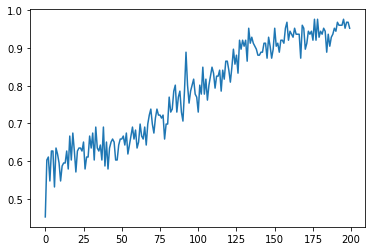

In [ ]:
plt.plot(history.history['accuracy'])

In [ ]:
score = convolutional.evaluate(val_data, val_labels, batch_size=8)

4/4 [==============================] - 0s 4ms/step - loss: 3.0661 - accuracy: 0.6000


In [ ]:
# Save convolutional model to JSON format
# serialize model to JSON
model_json = convolutional.to_json()
with open(path_models + 'convolutional.json', "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
convolutional.save_weights(path_models + "convolutional_weights.h5")
print("Saved convolutional model to disk")

Saved convolutional model to disk


# Show results of trained models on images

In [ ]:
results = []
for real_img_name in os.listdir(path_real_pics):
    # Load and resize real images
    real_img = cv2.imread(path_real_pics + real_img_name, cv2.IMREAD_COLOR)
    real_img = cv2.resize(real_img, (img_width, img_height))
    # Apply mobilenet without top layers to extract features from the real image
    real_feat = mobilenet.predict(real_img.reshape(1, img_width, img_height, 3))
    
    for cad_img_name in os.listdir(path_cad_pics):
        if (cad_img_name[:-4] in real_img_name) and (".png" in cad_img_name):
            # load, resize and normalize cad image
            cad_img = cv2.imread(path_cad_pics + cad_img_name, cv2.IMREAD_COLOR)
            cad_img = (cv2.resize(cad_img, (256, 256))/ 127.5) - 1 
            gen_img = generator(cad_img[np.newaxis, ...], training=True)
            gen_img = gen_img[0] * 0.5 + 0.5 
            gen_img = cv2.resize(np.asarray(gen_img), (img_width, img_height))
    
    # Apply mobilenet without top layers to extract features from the generated image
    gen_feat = mobilenet.predict(gen_img.reshape(1, img_width, img_height, 3))
    
    # concatenate features extracted from real and generated images
    feat_arr = np.concatenate((real_feat, gen_feat), axis=1)
    feat_arr = feat_arr[:, :, :, :-1].reshape((1, 341, -1, 3))
    
    # Define label for the current image
    label = 'Bad' if "bad" in real_img_name else 'Good'
    
    prediction = np.argmax(convolutional.predict(feat_arr))
    
    prediction = 'Bad' if prediction == 1 else 'Good'
    results.append(label == prediction) 
    if label != prediction:
        plt.title("Label: " + label + "    " + "Prediction: " + prediction)
        plt.imshow(real_img)
        plt.axis('off')
        plt.show()

print("Total Accuracy: ", np.sum(np.asarray(results)/len(results)))

Output hidden; open in https://colab.research.google.com to view.

# Train Convolutional with Validation

4/4 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4000
[0.5396825671195984, 0.4761904776096344, 0.4841269850730896, 0.60317462682724, 0.5952380895614624] [30.813892364501953, 2.7347562313079834, 1.7651968002319336, 0.6877201199531555, 0.6871747970581055]
16/16 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.5952
[0.6871021389961243, 0.5952380895614624]
4/4 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.4000
[0.5952380895614624, 0.5952380895614624, 0.5952380895614624, 0.5952380895614624, 0.5952380895614624] [0.6925827264785767, 0.6866726279258728, 0.6918489336967468, 0.6915284991264343, 0.6858590245246887]
4/4 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.4000
[0.5952380895614624, 0.5952380895614624, 0.5952380895614624, 0.5952380895614624, 0.5952380895614624] [0.691074550151825, 0.6852408051490784, 0.6848330497741699, 0.6846113801002502, 0.6897149682044983]
4/4 [=========

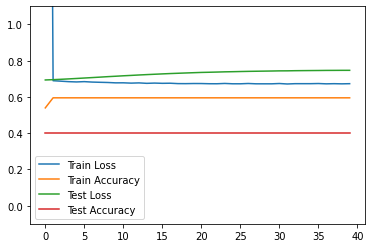

In [ ]:
# Define Convolutional model
convolutional = Sequential()
convolutional.add(Flatten())
convolutional.add(Dense(64, activation='relu'))
convolutional.add(Dropout(0.5))
convolutional.add(Dense(2, activation='softmax'))

# Train Convolutional Model
convolutional.compile(loss='categorical_crossentropy', optimizer="Adam", metrics=['accuracy'])

EPOCHS = 200
validation_interval = 5
best_score = [100, 0] # [loss, accuracy]
history = []
for epoch in range(round(EPOCHS/validation_interval)):
  hist = convolutional.fit(train_data, train_labels, epochs=validation_interval, 
                              batch_size=BATCH_SIZE, verbose=0)
  val_loss, val_acc = convolutional.evaluate(val_data, val_labels, batch_size=8)
  history.append([sum(hist.history["loss"])/(validation_interval), 
                  sum(hist.history["accuracy"])/(validation_interval), 
                  val_loss, val_acc])
  print(hist.history["accuracy"], hist.history["loss"])
 
  if val_loss < best_score[0]:
    best_weights = convolutional.get_weights()
    best_score = [val_loss, val_acc]
    print(convolutional.evaluate(train_data, train_labels, batch_size=8))

for i in range(4):
    plt.plot(np.asarray(history)[:, i])
plt.ylim(-0.1, 1.1)
plt.legend(["Train Loss", "Train Accuracy", "Test Loss", "Test Accuracy"])
convolutional.set_weights(best_weights)
print("Best val loss:", best_score[0], "    Validation Accuracy:", best_score[1])

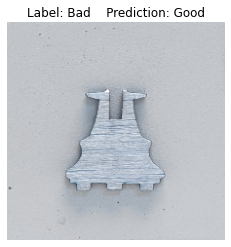

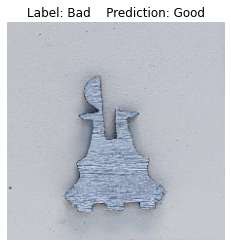

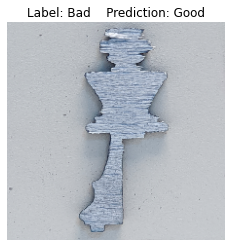

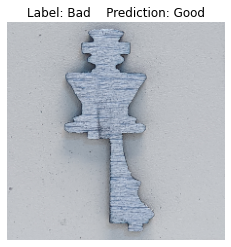

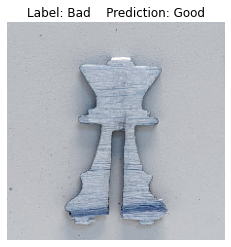

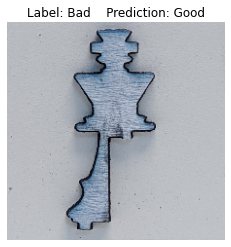

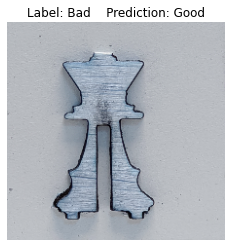

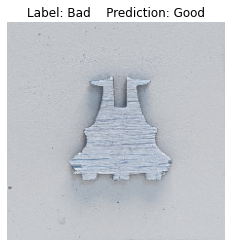

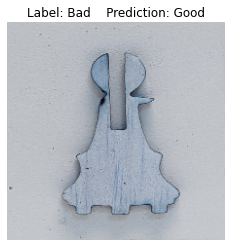

Total Accuracy:  0.9423076923076921


In [ ]:
results = []
for real_img_name in os.listdir(path_real_pics):
    # Load and resize real images
    real_img = cv2.imread(path_real_pics + real_img_name, cv2.IMREAD_COLOR)
    real_img = cv2.resize(real_img, (img_width, img_height))
    # Apply mobilenet without top layers to extract features from the real image
    real_feat = mobilenet.predict(real_img.reshape(1, img_width, img_height, 3))
    
    for cad_img_name in os.listdir(path_cad_pics):
        if (cad_img_name[:-4] in real_img_name) and (".png" in cad_img_name):
            # load, resize and normalize cad image
            cad_img = cv2.imread(path_cad_pics + cad_img_name, cv2.IMREAD_COLOR)
            cad_img = (cv2.resize(cad_img, (256, 256))/ 127.5) - 1 
            gen_img = generator(cad_img[np.newaxis, ...], training=True)
            gen_img = gen_img[0] * 0.5 + 0.5 
            gen_img = cv2.resize(np.asarray(gen_img), (img_width, img_height))
    
    # Apply mobilenet without top layers to extract features from the generated image
    gen_feat = mobilenet.predict(gen_img.reshape(1, img_width, img_height, 3))
    
    # concatenate features extracted from real and generated images
    feat_arr = np.concatenate((real_feat, gen_feat), axis=1)
    feat_arr = feat_arr[:, :, :, :-1].reshape((1, 341, -1, 3))
    
    # Define label for the current image
    label = 'Bad' if "bad" in real_img_name else 'Good'
    
    prediction = np.argmax(convolutional.predict(feat_arr))
    
    prediction = 'Bad' if prediction == 1 else 'Good'
    results.append(label == prediction) 
    if label != prediction:
        plt.title("Label: " + label + "    " + "Prediction: " + prediction)
        plt.imshow(real_img)
        plt.axis('off')
        plt.show()

print("Total Accuracy: ", np.sum(np.asarray(results)/len(results)))